In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


train_dataset = torchvision.datasets.CIFAR10(root="./data", train=True, transform=transform, download=True)
test_dataset = torchvision.datasets.CIFAR10(root="./data", train=False, transform=transform, download=True)


batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


Files already downloaded and verified
Files already downloaded and verified


In [ ]:
class VAE(nn.Module):
    def __init__(self, latent_dim=256):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Dropout(0.3),  # Regularization

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
        )

        self.fc_mu = nn.Linear(128 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(128 * 4 * 4, latent_dim)


        self.decoder_input = nn.Linear(latent_dim, 128 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def reparameterization(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        mu, logvar = self.fc_mu(x), self.fc_logvar(x)
        z = self.reparameterization(mu, logvar)
        x = self.decoder_input(z).view(x.size(0), 128, 4, 4)
        x = self.decoder(x)
        return x, mu, logvar


In [ ]:
def vae_loss(recon_x, x, mu, logvar, beta=4, l1_lambda=1e-5, l2_lambda=1e-4, model=None):
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')  # MSE Loss
    kl_div = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())  # KL Divergence

    if model:  # Only apply L1/L2 regularization if model is provided
        l1_loss = sum(p.abs().sum() for p in model.parameters())  # L1 Regularization
        l2_loss = sum((p ** 2).sum() for p in model.parameters())  # L2 Regularization
        return recon_loss + beta * kl_div + l1_lambda * l1_loss + l2_lambda * l2_loss
    else:
        return recon_loss + beta * kl_div  # No L1/L2 if model is None


In [ ]:
# Define device (use GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
loss_values = []
kl_values = []
recon_values = []

def train_vae(model, train_loader, optimizer, epoch, device='cuda', beta=4):
    model.train()
    train_loss, recon_loss_total, kl_div_total = 0, 0, 0
    # Define device (use GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        optimizer.zero_grad()

        recon_batch, mu, logvar = model(data)
        loss = vae_loss(recon_batch, data, mu, logvar, beta, model=model)  # Pass model here
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        recon_loss_total += F.mse_loss(recon_batch, data, reduction='sum').item()
        kl_div_total += (-0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())).item()

    # Store losses for visualization
    avg_loss = train_loss / len(train_loader.dataset)
    avg_recon_loss = recon_loss_total / len(train_loader.dataset)
    avg_kl_loss = kl_div_total / len(train_loader.dataset)

    loss_values.append(avg_loss)
    recon_values.append(avg_recon_loss)
    kl_values.append(avg_kl_loss)

    print(f'==> Epoch {epoch}: Average Loss: {avg_loss:.4f}, Recon Loss: {avg_recon_loss:.4f}, KL Divergence: {avg_kl_loss:.4f}')

    # Show generated images after every epoch
    model.eval()
    with torch.no_grad():
        sample = data[:8].to(device)  # Take 8 samples from dataset
        reconstructed, _, _ = model(sample)

        # Rescale from [-1,1] to [0,1] for visualization
        sample = (sample + 1) / 2
        reconstructed = (reconstructed + 1) / 2

        # Plot original vs reconstructed images
        plt.figure(figsize=(10, 2))
        for i in range(8):
            plt.subplot(2, 8, i + 1)
            plt.imshow(sample[i].cpu().numpy().transpose(1, 2, 0))
            plt.axis('off')

            plt.subplot(2, 8, i + 9)
            plt.imshow(reconstructed[i].cpu().numpy().transpose(1, 2, 0))
            plt.axis('off')

        plt.show()


==> Epoch 1: Average Loss: 627.7673, Recon Loss: 532.3784, KL Divergence: 23.8463


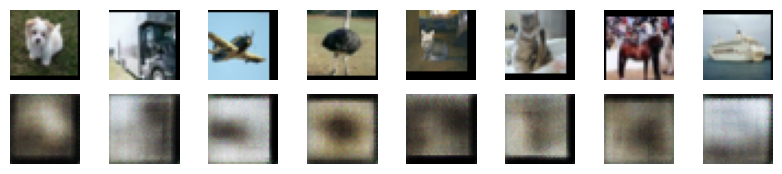

==> Epoch 2: Average Loss: 434.9059, Recon Loss: 337.3464, KL Divergence: 24.3890


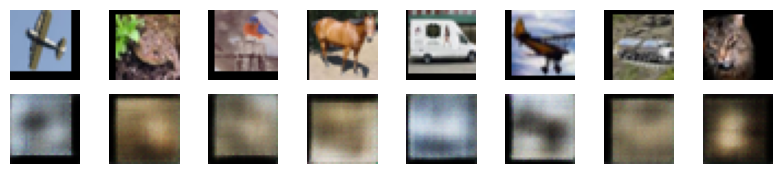

==> Epoch 3: Average Loss: 382.5572, Recon Loss: 287.9351, KL Divergence: 23.6547


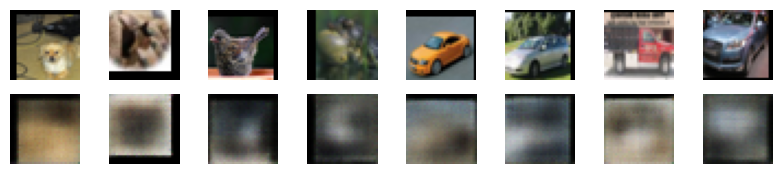

==> Epoch 4: Average Loss: 362.4817, Recon Loss: 267.5239, KL Divergence: 23.7386


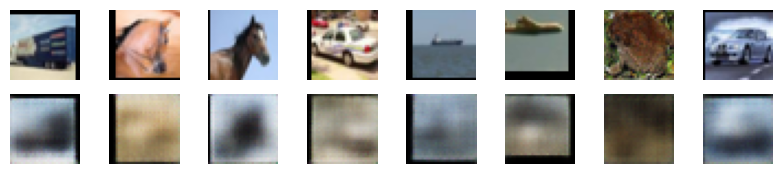

==> Epoch 5: Average Loss: 353.7105, Recon Loss: 257.9225, KL Divergence: 23.9461


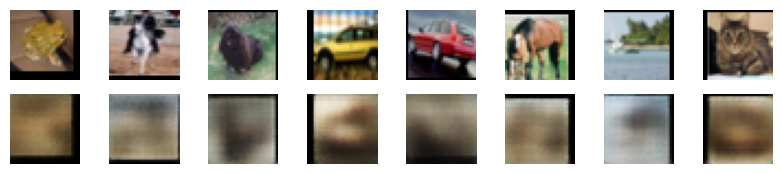

==> Epoch 6: Average Loss: 348.6618, Recon Loss: 252.6246, KL Divergence: 24.0084


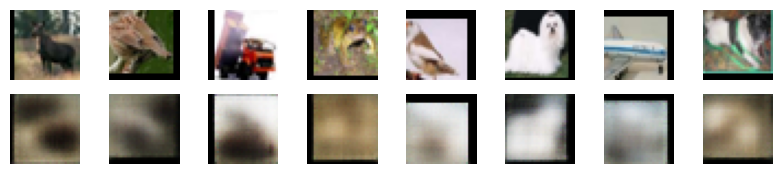

==> Epoch 7: Average Loss: 344.2307, Recon Loss: 248.4561, KL Divergence: 23.9428


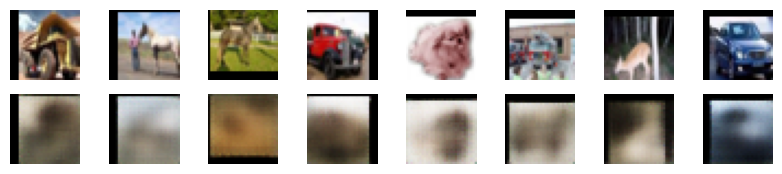

==> Epoch 8: Average Loss: 341.7004, Recon Loss: 245.7483, KL Divergence: 23.9871


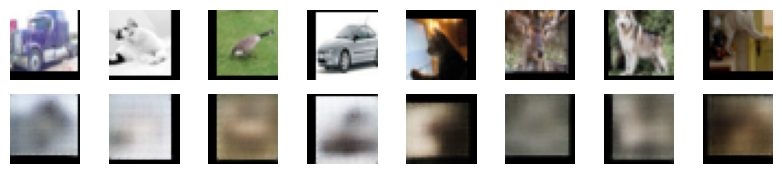

==> Epoch 9: Average Loss: 339.6114, Recon Loss: 243.5975, KL Divergence: 24.0025


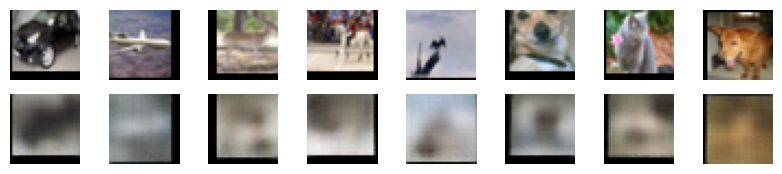

==> Epoch 10: Average Loss: 336.9050, Recon Loss: 240.5855, KL Divergence: 24.0789


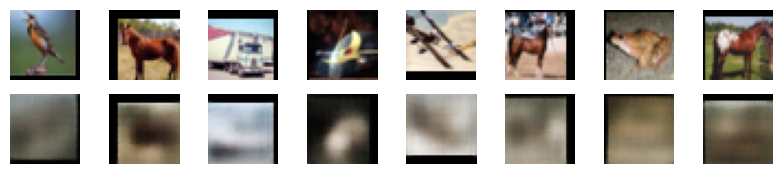

==> Epoch 11: Average Loss: 335.2934, Recon Loss: 238.1369, KL Divergence: 24.2881


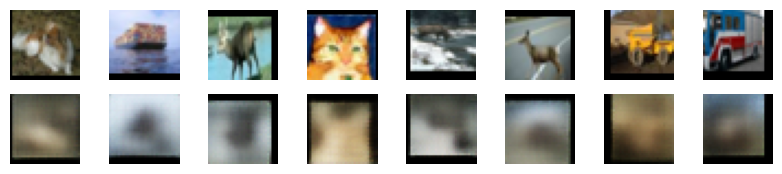

==> Epoch 12: Average Loss: 333.2176, Recon Loss: 235.9792, KL Divergence: 24.3086


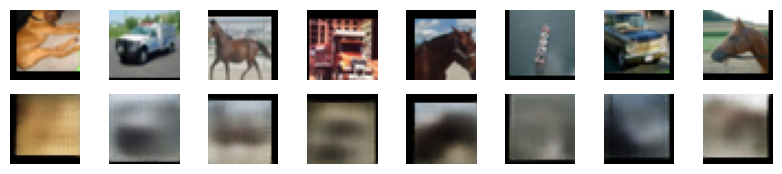

==> Epoch 13: Average Loss: 332.0999, Recon Loss: 234.2055, KL Divergence: 24.4726


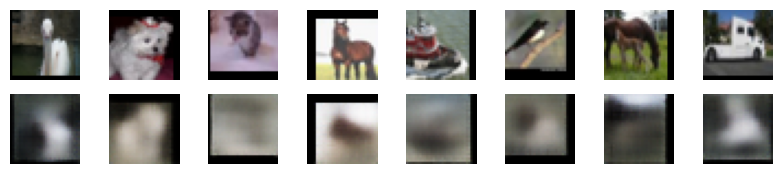

==> Epoch 14: Average Loss: 330.2822, Recon Loss: 232.2558, KL Divergence: 24.5056


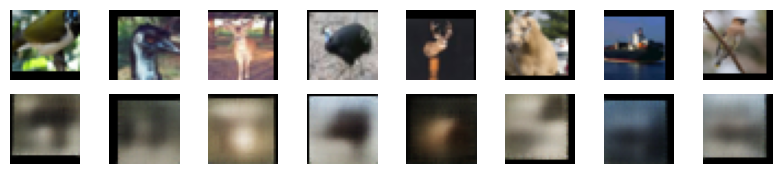

==> Epoch 15: Average Loss: 329.0090, Recon Loss: 230.8084, KL Divergence: 24.5491


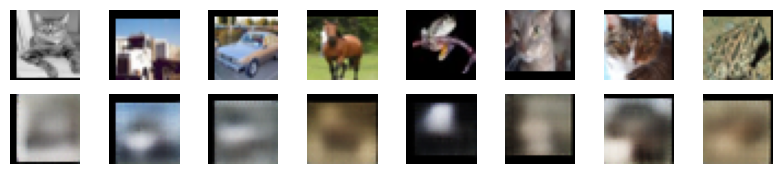

==> Epoch 16: Average Loss: 328.6453, Recon Loss: 230.0809, KL Divergence: 24.6400


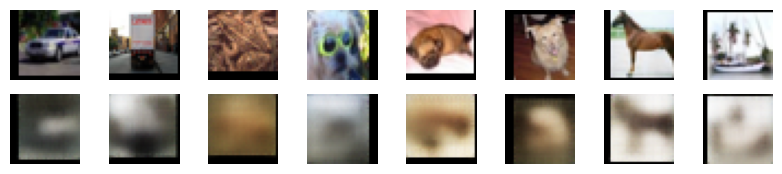

==> Epoch 17: Average Loss: 327.4514, Recon Loss: 228.9574, KL Divergence: 24.6224


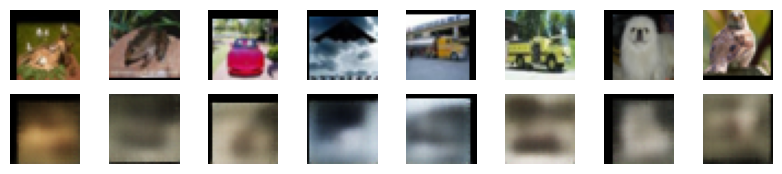

==> Epoch 18: Average Loss: 327.0287, Recon Loss: 228.5915, KL Divergence: 24.6082


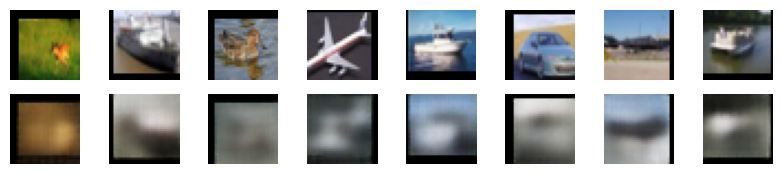

==> Epoch 19: Average Loss: 326.6675, Recon Loss: 228.3040, KL Divergence: 24.5897


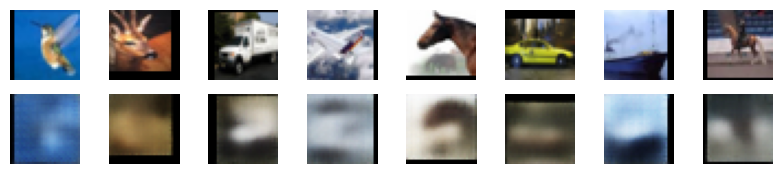

==> Epoch 20: Average Loss: 326.3378, Recon Loss: 228.0166, KL Divergence: 24.5791


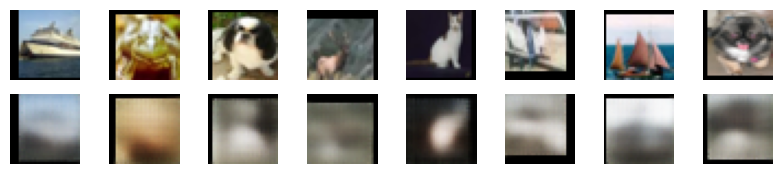

==> Epoch 21: Average Loss: 325.6485, Recon Loss: 227.3029, KL Divergence: 24.5852


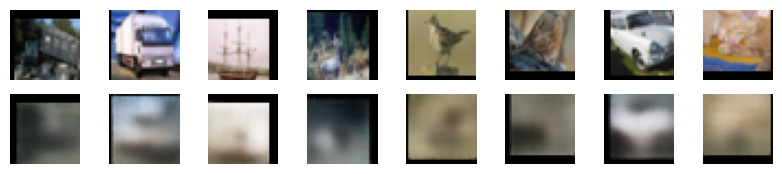

==> Epoch 22: Average Loss: 324.7397, Recon Loss: 226.5610, KL Divergence: 24.5435


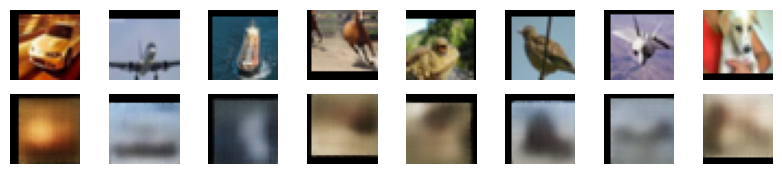

==> Epoch 23: Average Loss: 324.1895, Recon Loss: 226.1279, KL Divergence: 24.5141


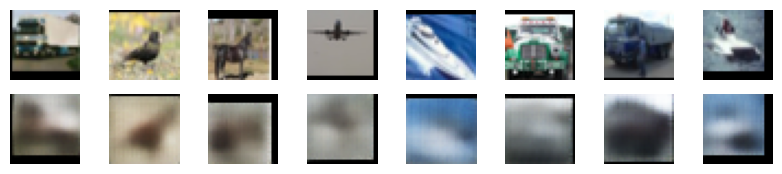

==> Epoch 24: Average Loss: 324.3616, Recon Loss: 225.9914, KL Divergence: 24.5913


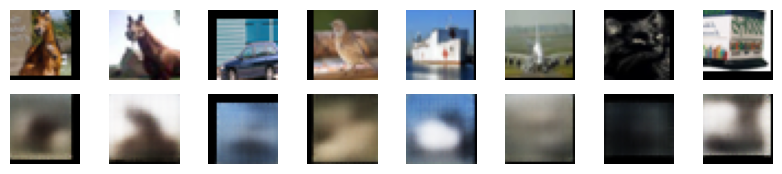

==> Epoch 25: Average Loss: 323.8075, Recon Loss: 225.8687, KL Divergence: 24.4834


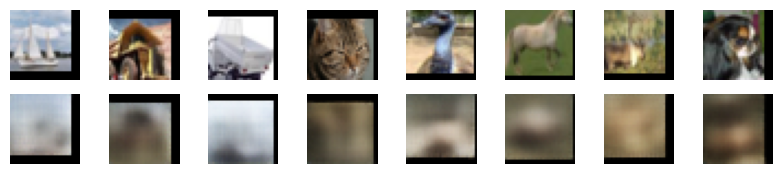

==> Epoch 26: Average Loss: 323.0080, Recon Loss: 225.0122, KL Divergence: 24.4976


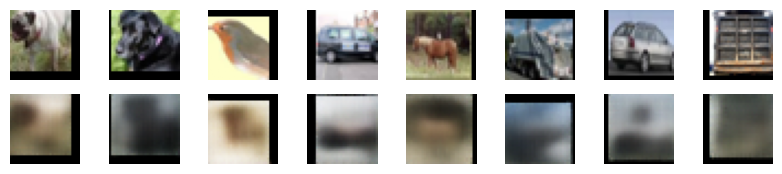

==> Epoch 27: Average Loss: 323.1411, Recon Loss: 225.0917, KL Divergence: 24.5110


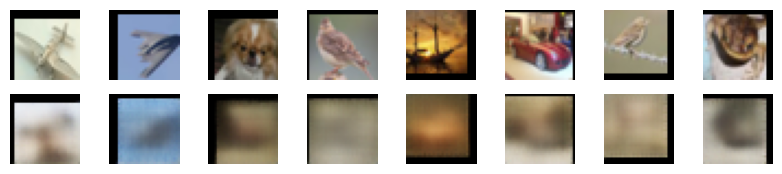

==> Epoch 28: Average Loss: 323.3157, Recon Loss: 225.2191, KL Divergence: 24.5228


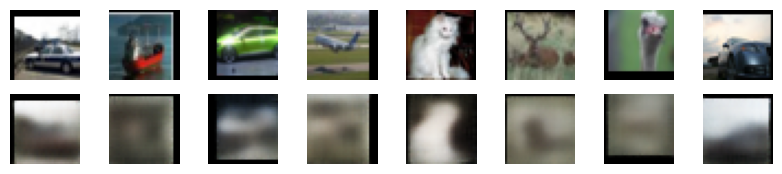

==> Epoch 29: Average Loss: 322.1818, Recon Loss: 224.2837, KL Divergence: 24.4731


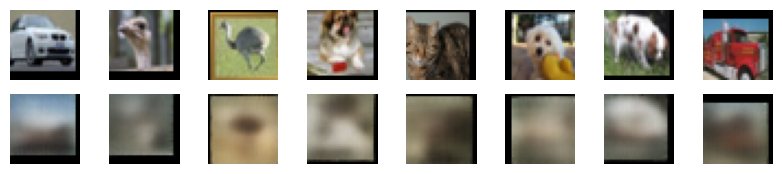

==> Epoch 30: Average Loss: 322.1432, Recon Loss: 224.0678, KL Divergence: 24.5174


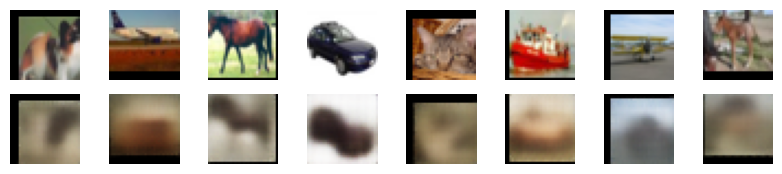

==> Epoch 31: Average Loss: 322.1457, Recon Loss: 224.2014, KL Divergence: 24.4846


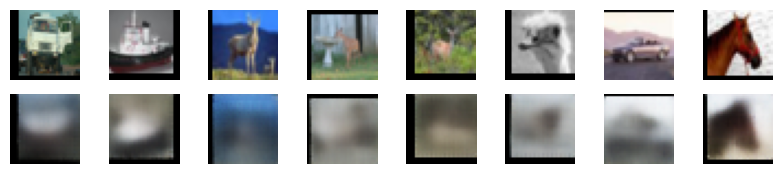

==> Epoch 32: Average Loss: 321.5726, Recon Loss: 223.5712, KL Divergence: 24.4989


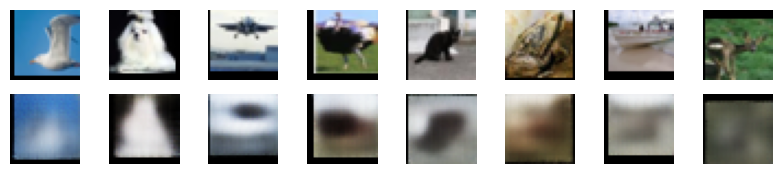

==> Epoch 33: Average Loss: 321.3294, Recon Loss: 223.4127, KL Divergence: 24.4777


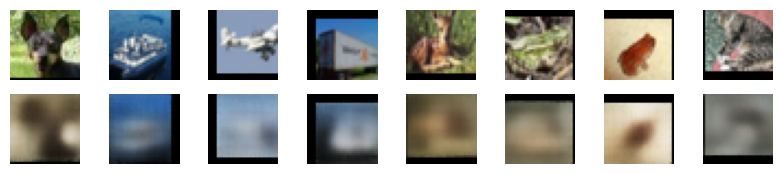

==> Epoch 34: Average Loss: 321.2634, Recon Loss: 223.4434, KL Divergence: 24.4535


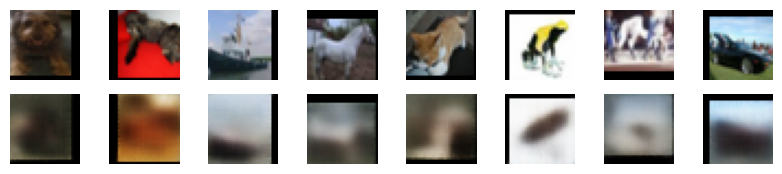

==> Epoch 35: Average Loss: 320.6812, Recon Loss: 222.9811, KL Divergence: 24.4235


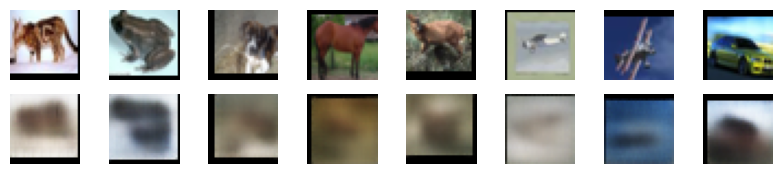

==> Epoch 36: Average Loss: 320.6555, Recon Loss: 222.7454, KL Divergence: 24.4760


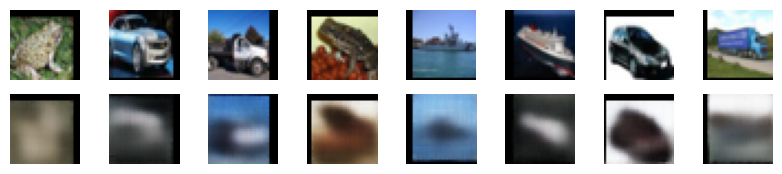

==> Epoch 37: Average Loss: 320.0719, Recon Loss: 222.2158, KL Divergence: 24.4624


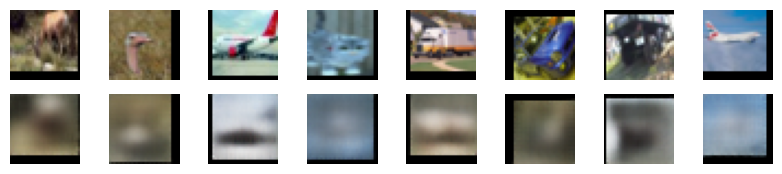

==> Epoch 38: Average Loss: 319.8241, Recon Loss: 221.9165, KL Divergence: 24.4753


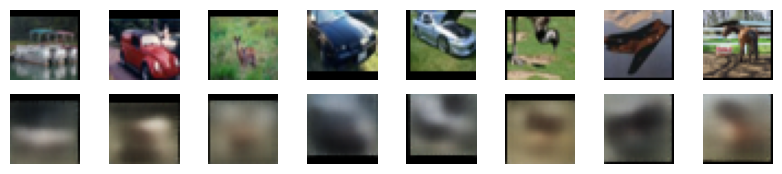

==> Epoch 39: Average Loss: 319.4146, Recon Loss: 221.7526, KL Divergence: 24.4139


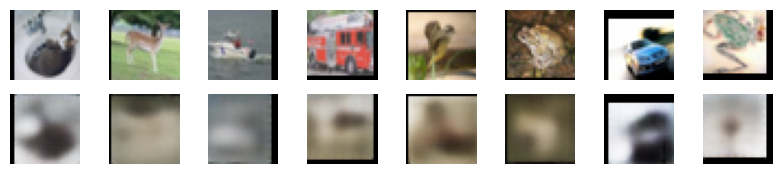

==> Epoch 40: Average Loss: 319.1027, Recon Loss: 221.1572, KL Divergence: 24.4847


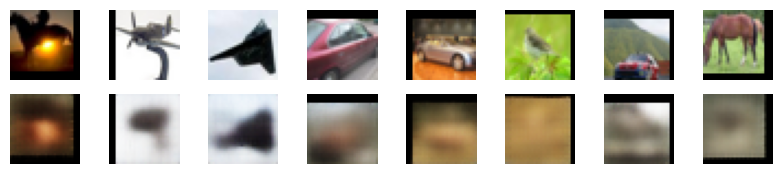

==> Epoch 41: Average Loss: 318.8878, Recon Loss: 221.2263, KL Divergence: 24.4137


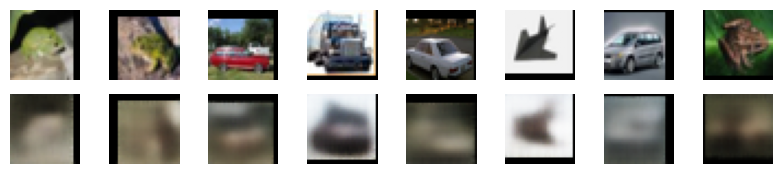

==> Epoch 42: Average Loss: 318.7216, Recon Loss: 221.1484, KL Divergence: 24.3916


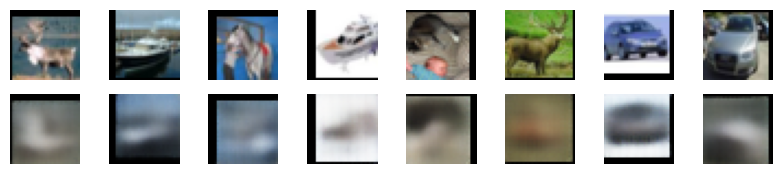

==> Epoch 43: Average Loss: 318.2182, Recon Loss: 220.5969, KL Divergence: 24.4036


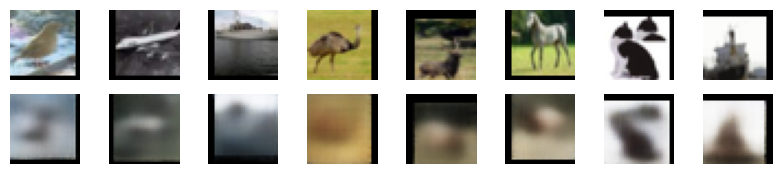

==> Epoch 44: Average Loss: 318.1995, Recon Loss: 220.6217, KL Divergence: 24.3927


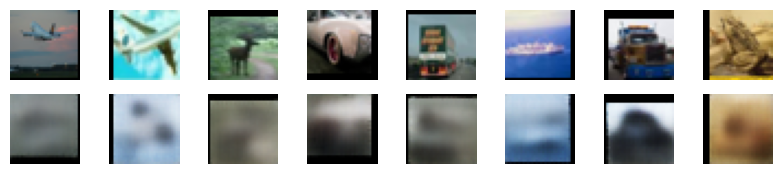

==> Epoch 45: Average Loss: 318.1996, Recon Loss: 220.5402, KL Divergence: 24.4131


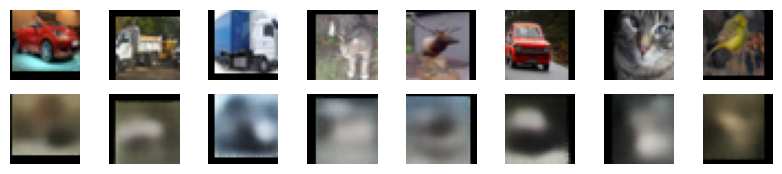

==> Epoch 46: Average Loss: 318.2262, Recon Loss: 220.6474, KL Divergence: 24.3929


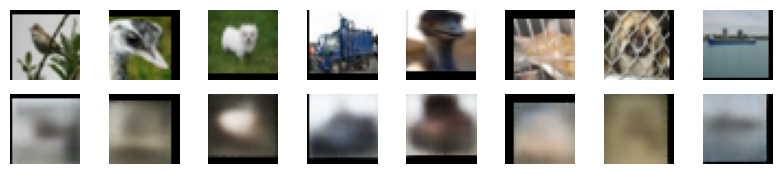

==> Epoch 47: Average Loss: 318.1075, Recon Loss: 220.4392, KL Divergence: 24.4153


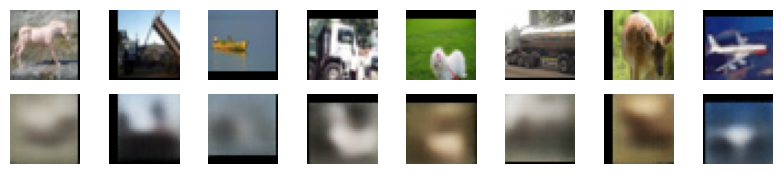

==> Epoch 48: Average Loss: 317.6795, Recon Loss: 220.1733, KL Divergence: 24.3747


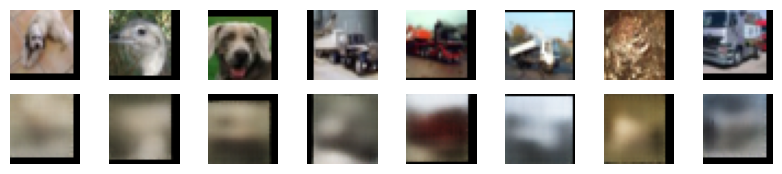

==> Epoch 49: Average Loss: 317.1465, Recon Loss: 219.5875, KL Divergence: 24.3879


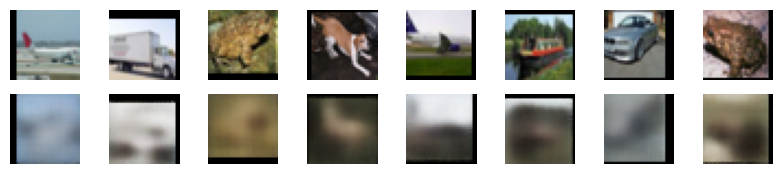

==> Epoch 50: Average Loss: 317.4552, Recon Loss: 219.7592, KL Divergence: 24.4221


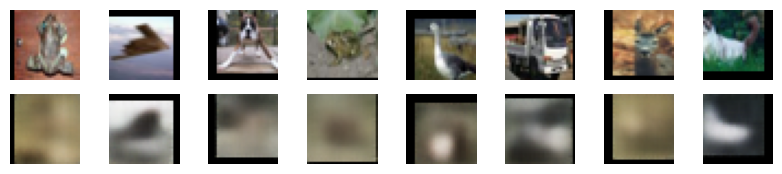

==> Epoch 51: Average Loss: 317.4246, Recon Loss: 219.6897, KL Divergence: 24.4318


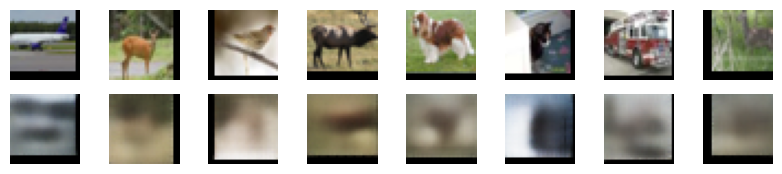

==> Epoch 52: Average Loss: 317.1239, Recon Loss: 219.5477, KL Divergence: 24.3921


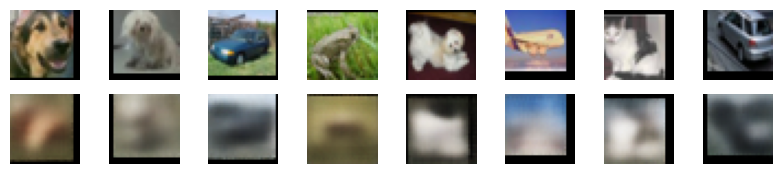

==> Epoch 53: Average Loss: 316.7514, Recon Loss: 219.1102, KL Divergence: 24.4083


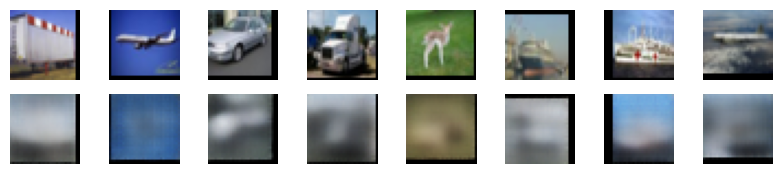

==> Epoch 54: Average Loss: 316.3328, Recon Loss: 218.7763, KL Divergence: 24.3872


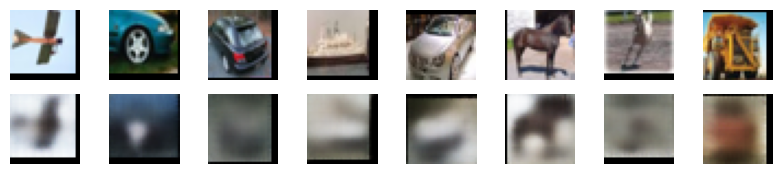

==> Epoch 55: Average Loss: 316.1787, Recon Loss: 218.7670, KL Divergence: 24.3509


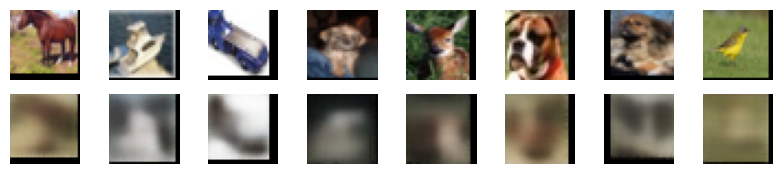

==> Epoch 56: Average Loss: 316.3257, Recon Loss: 218.7126, KL Divergence: 24.4013


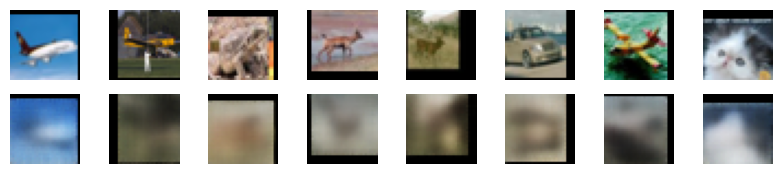

==> Epoch 57: Average Loss: 316.0513, Recon Loss: 218.4212, KL Divergence: 24.4055


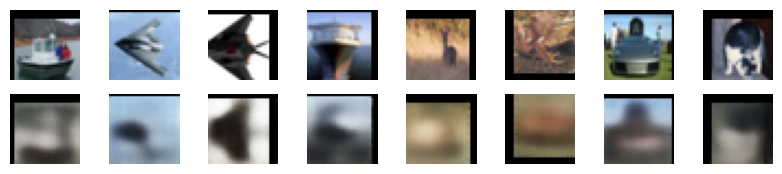

==> Epoch 58: Average Loss: 316.0751, Recon Loss: 218.3824, KL Divergence: 24.4211


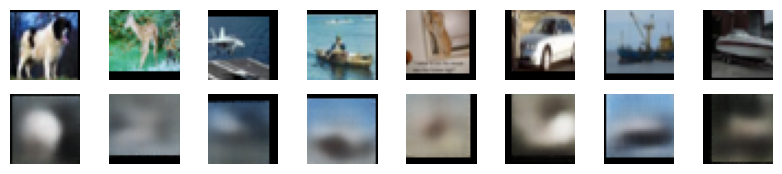

==> Epoch 59: Average Loss: 315.7148, Recon Loss: 217.8005, KL Divergence: 24.4765


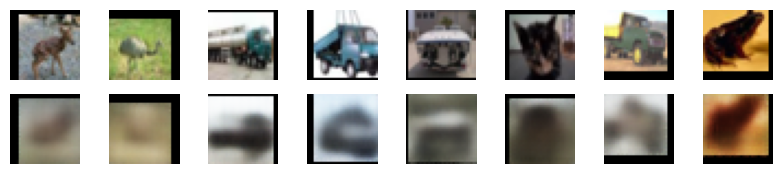

==> Epoch 60: Average Loss: 315.4928, Recon Loss: 217.7358, KL Divergence: 24.4371


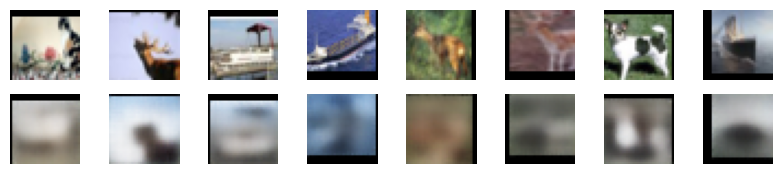

==> Epoch 61: Average Loss: 315.4593, Recon Loss: 217.2196, KL Divergence: 24.5578


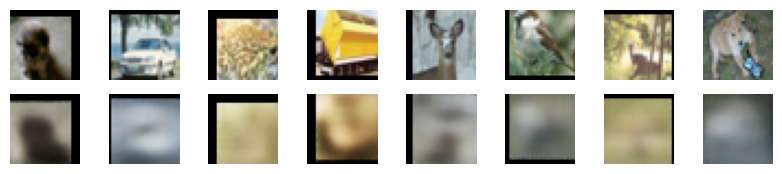

==> Epoch 62: Average Loss: 315.3325, Recon Loss: 217.3166, KL Divergence: 24.5018


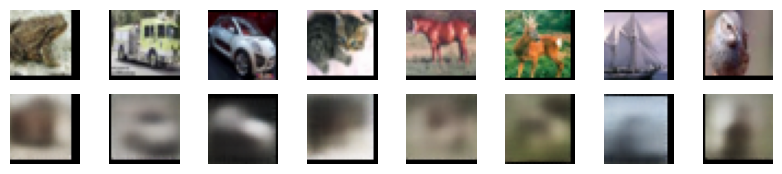

==> Epoch 63: Average Loss: 315.2953, Recon Loss: 217.2275, KL Divergence: 24.5147


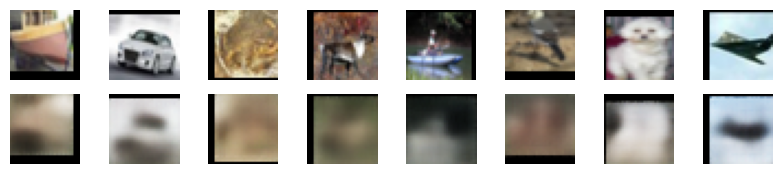

==> Epoch 64: Average Loss: 314.7487, Recon Loss: 216.5198, KL Divergence: 24.5550


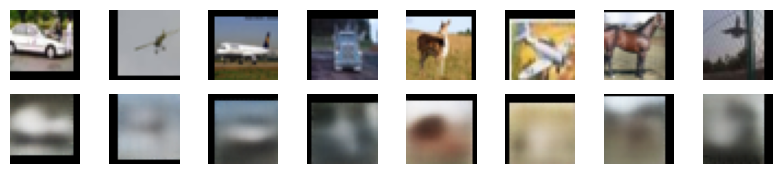

==> Epoch 65: Average Loss: 314.4234, Recon Loss: 216.1964, KL Divergence: 24.5545


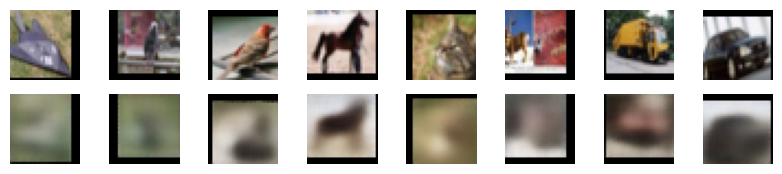

==> Epoch 66: Average Loss: 314.3500, Recon Loss: 215.8160, KL Divergence: 24.6312


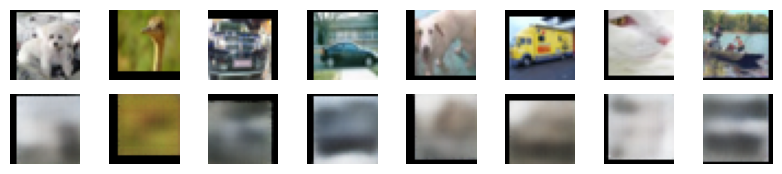

==> Epoch 67: Average Loss: 313.8698, Recon Loss: 215.3875, KL Divergence: 24.6183


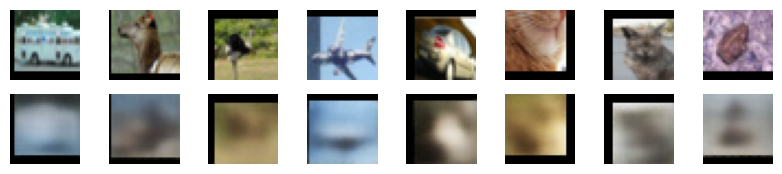

==> Epoch 68: Average Loss: 314.1249, Recon Loss: 215.3825, KL Divergence: 24.6833


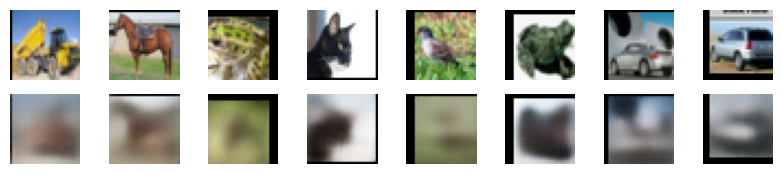

==> Epoch 69: Average Loss: 313.5684, Recon Loss: 214.8657, KL Divergence: 24.6733


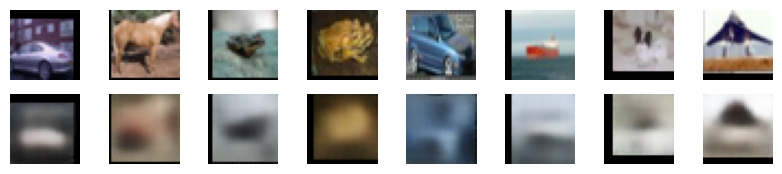

==> Epoch 70: Average Loss: 313.7541, Recon Loss: 214.9886, KL Divergence: 24.6890


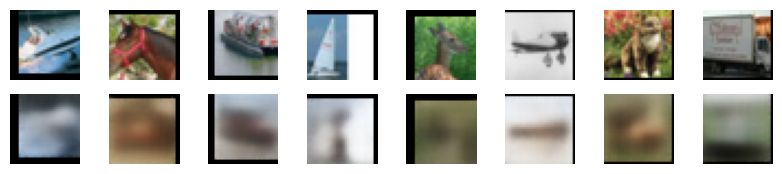

==> Epoch 71: Average Loss: 313.6186, Recon Loss: 214.7056, KL Divergence: 24.7259


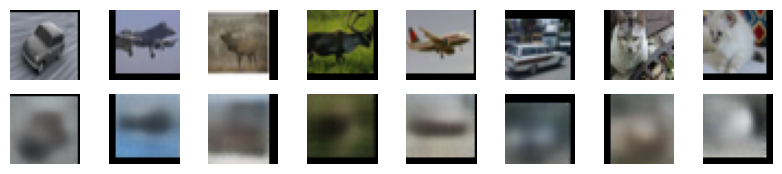

==> Epoch 72: Average Loss: 313.3022, Recon Loss: 214.6069, KL Divergence: 24.6714


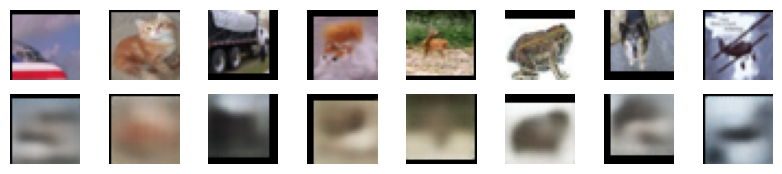

==> Epoch 73: Average Loss: 313.0345, Recon Loss: 214.1325, KL Divergence: 24.7231


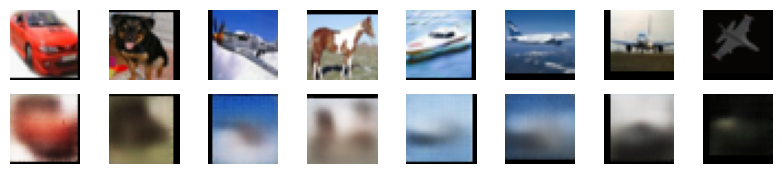

==> Epoch 74: Average Loss: 313.1367, Recon Loss: 214.4027, KL Divergence: 24.6811


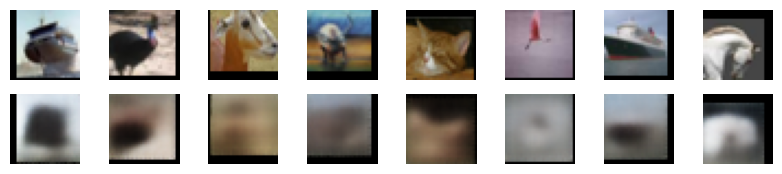

==> Epoch 75: Average Loss: 313.0388, Recon Loss: 214.0397, KL Divergence: 24.7473


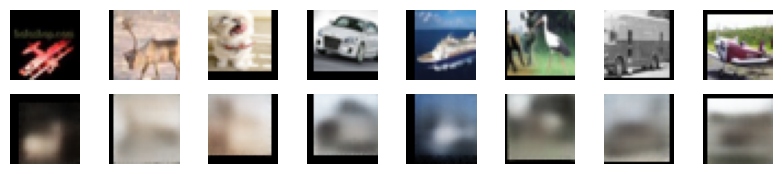

==> Epoch 76: Average Loss: 312.9302, Recon Loss: 214.0256, KL Divergence: 24.7236


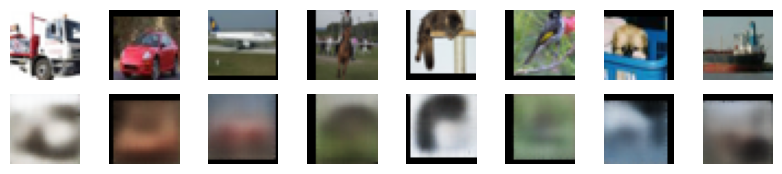

==> Epoch 77: Average Loss: 312.6196, Recon Loss: 213.6571, KL Divergence: 24.7381


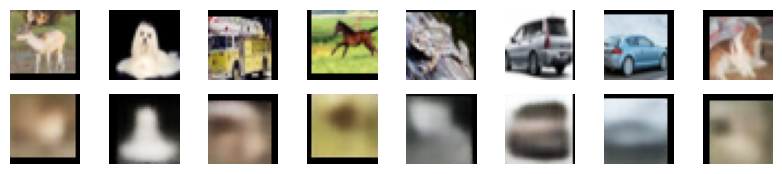

==> Epoch 78: Average Loss: 312.1662, Recon Loss: 213.3249, KL Divergence: 24.7078


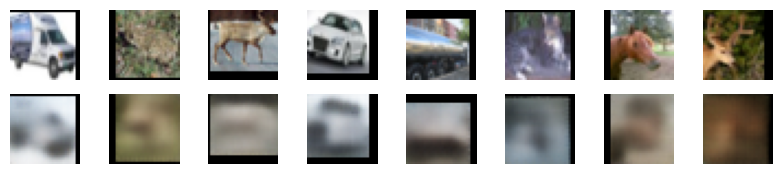

==> Epoch 79: Average Loss: 312.4879, Recon Loss: 213.4640, KL Divergence: 24.7534


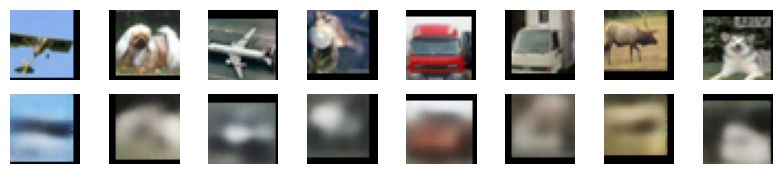

==> Epoch 80: Average Loss: 312.0732, Recon Loss: 212.8972, KL Divergence: 24.7914


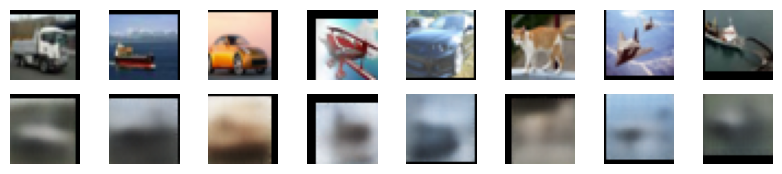

==> Epoch 81: Average Loss: 312.3183, Recon Loss: 213.5138, KL Divergence: 24.6985


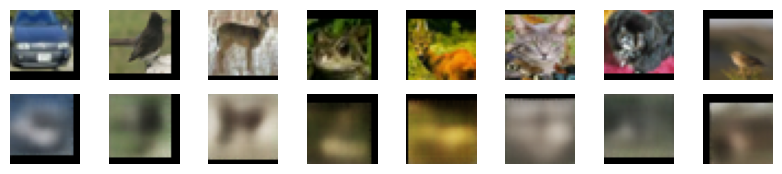

==> Epoch 82: Average Loss: 312.0652, Recon Loss: 213.1674, KL Divergence: 24.7218


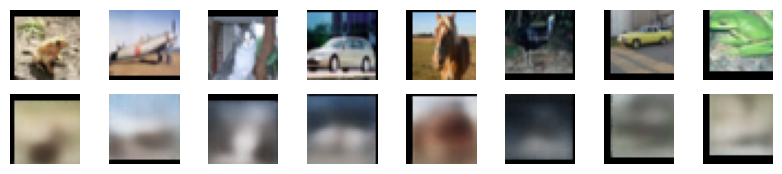

==> Epoch 83: Average Loss: 312.1752, Recon Loss: 213.0242, KL Divergence: 24.7851


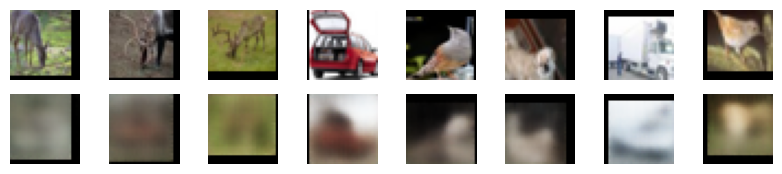

==> Epoch 84: Average Loss: 311.9502, Recon Loss: 212.8982, KL Divergence: 24.7603


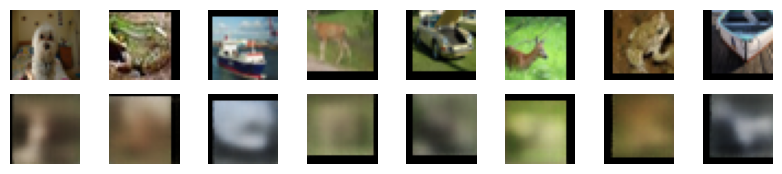

==> Epoch 85: Average Loss: 311.8848, Recon Loss: 212.8573, KL Divergence: 24.7542


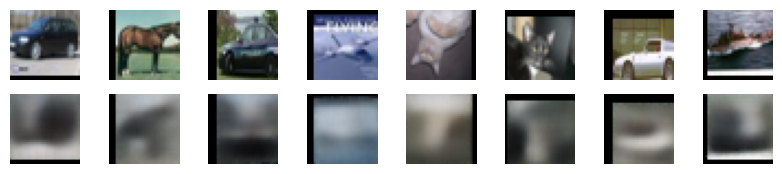

==> Epoch 86: Average Loss: 311.9619, Recon Loss: 212.7884, KL Divergence: 24.7907


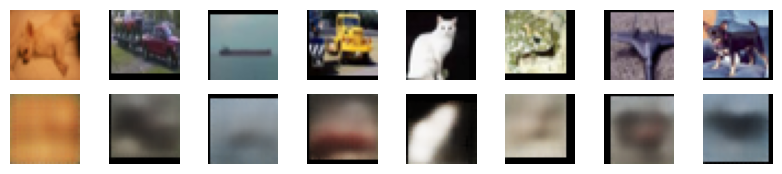

==> Epoch 87: Average Loss: 311.8765, Recon Loss: 212.8072, KL Divergence: 24.7646


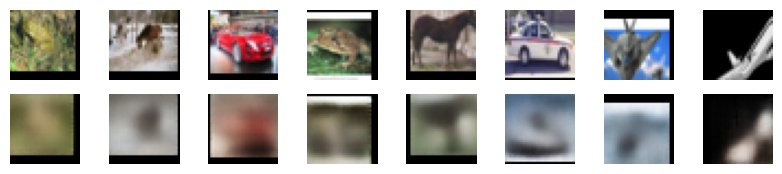

==> Epoch 88: Average Loss: 311.7090, Recon Loss: 212.5393, KL Divergence: 24.7896


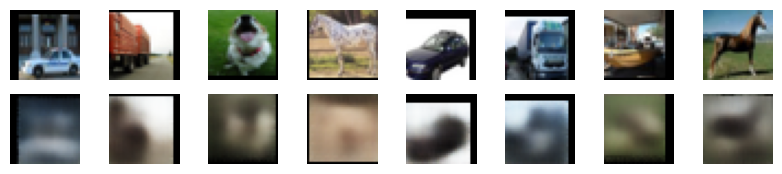

==> Epoch 89: Average Loss: 311.3800, Recon Loss: 212.3472, KL Divergence: 24.7554


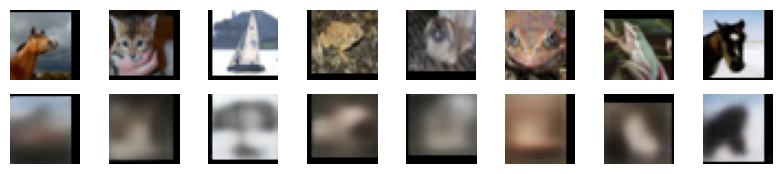

==> Epoch 90: Average Loss: 311.1026, Recon Loss: 212.0064, KL Divergence: 24.7712


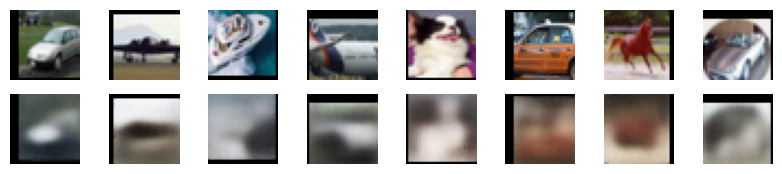

==> Epoch 91: Average Loss: 311.5021, Recon Loss: 212.4468, KL Divergence: 24.7610


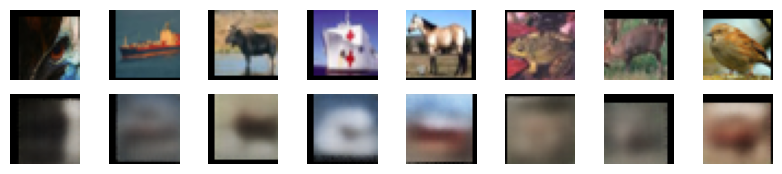

==> Epoch 92: Average Loss: 311.5852, Recon Loss: 212.3087, KL Divergence: 24.8163


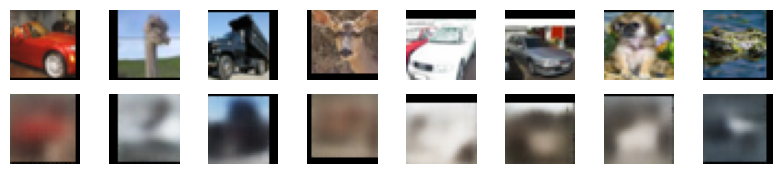

==> Epoch 93: Average Loss: 311.3145, Recon Loss: 212.1651, KL Divergence: 24.7844


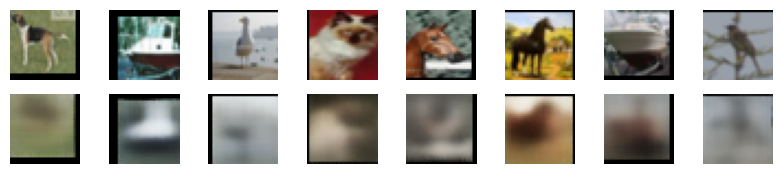

==> Epoch 94: Average Loss: 311.1184, Recon Loss: 212.0199, KL Divergence: 24.7717


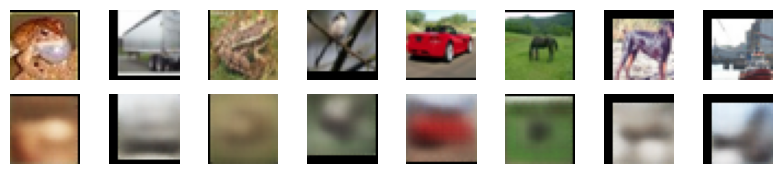

==> Epoch 95: Average Loss: 310.6024, Recon Loss: 211.5213, KL Divergence: 24.7673


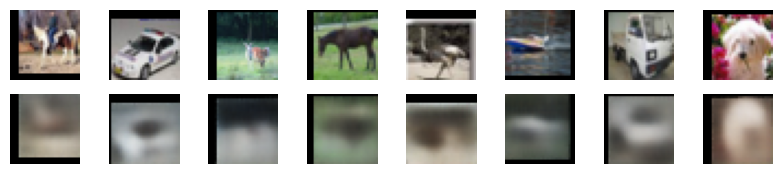

==> Epoch 96: Average Loss: 310.8066, Recon Loss: 211.8024, KL Divergence: 24.7481


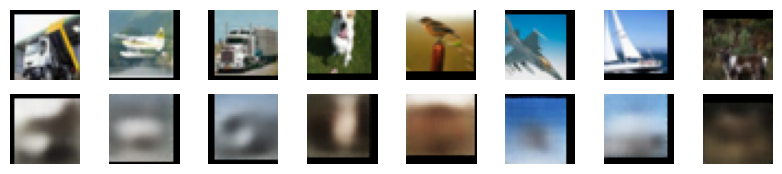

==> Epoch 97: Average Loss: 310.9837, Recon Loss: 211.7254, KL Divergence: 24.8116


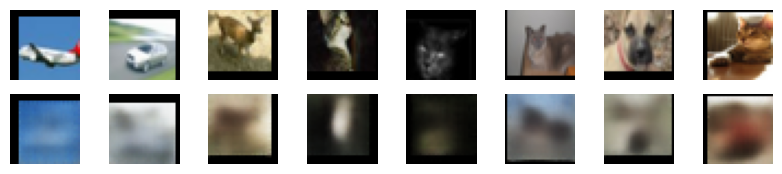

==> Epoch 98: Average Loss: 310.5438, Recon Loss: 211.4669, KL Divergence: 24.7662


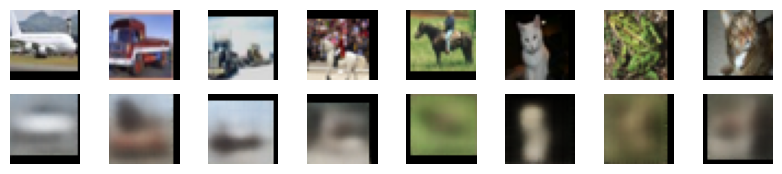

==> Epoch 99: Average Loss: 310.5953, Recon Loss: 211.5619, KL Divergence: 24.7553


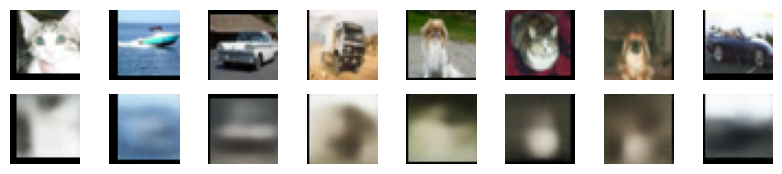

==> Epoch 100: Average Loss: 310.8306, Recon Loss: 211.6862, KL Divergence: 24.7830


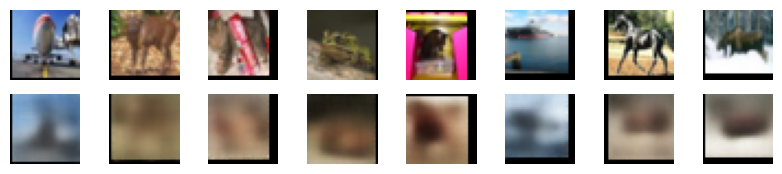

In [ ]:
vae = VAE(latent_dim=256).to(device)
optimizer = optim.Adam(vae.parameters(), lr=0.0005, weight_decay=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

EPOCHS = 100
for epoch in range(1, EPOCHS + 1):
    train_vae(vae, train_loader, optimizer, epoch)



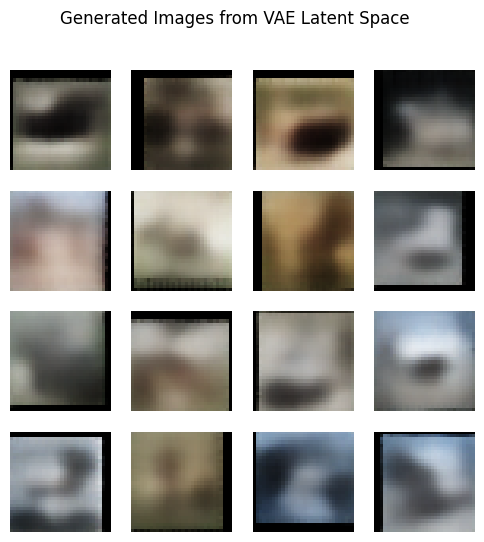

In [ ]:
vae.eval()
with torch.no_grad():
    z = torch.randn(16, 256).to(device)
    generated_images = vae.decoder(vae.decoder_input(z).view(16, 128, 4, 4)).cpu()

# Plot generated images
fig, axes = plt.subplots(4, 4, figsize=(6, 6))
for i, ax in enumerate(axes.flat):
    ax.imshow(generated_images[i].permute(1, 2, 0).numpy() * 0.5 + 0.5)
    ax.axis("off")

plt.suptitle("Generated Images from VAE Latent Space")
plt.show()


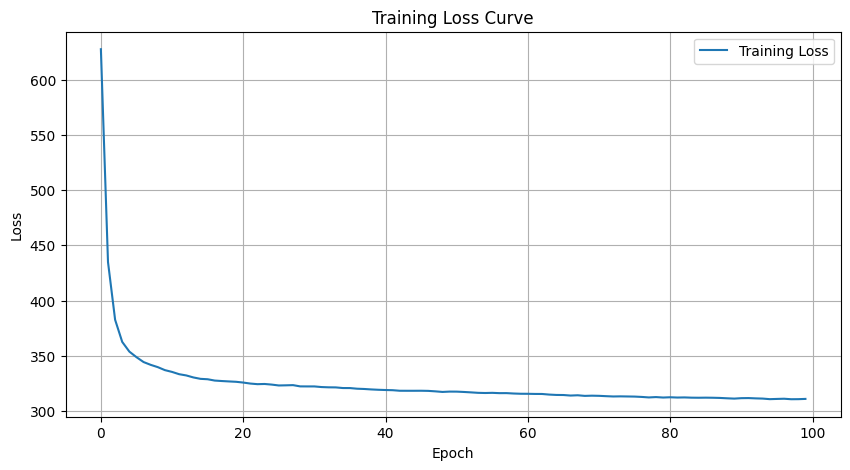

In [ ]:
# Plotting the training loss curve
plt.figure(figsize=(10, 5))
plt.plot(loss_values, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Curve")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
torch.save(vae.state_dict(), "vae_cifar10.pth")
print("✅ VAE model saved!")


✅ VAE model saved!


In [ ]:
# prompt: i want to save and download my model to local directory in my pc

from google.colab import files
files.download('vae_cifar10.pth')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

test_images, _ = next(iter(test_loader))
test_images = test_images.to(device)


vae.eval()
with torch.no_grad():
    reconstructed_images, _, _ = vae(test_images)

loss = F.mse_loss(reconstructed_images, test_images).item()
print(f"🔹 VAE Reconstruction Loss: {loss:.4f}")


🔹 VAE Reconstruction Loss: 0.0661


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision
from torch.utils.data import DataLoader


class Autoencoder(nn.Module):
    def __init__(self, latent_dim=100):
        super(Autoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, latent_dim)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 128 * 4 * 4),
            nn.ReLU(),
            nn.Unflatten(1, (128, 4, 4)),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = torchvision.datasets.CIFAR10(root="./data", train=True, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)


ae_model = Autoencoder(latent_dim=100).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(ae_model.parameters(), lr=0.001)


num_epochs = 50
for epoch in range(num_epochs):
    total_loss = 0
    for images, _ in train_loader:
        images = images.to(device)
        optimizer.zero_grad()
        outputs = ae_model(images)
        loss = criterion(outputs, images)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], AE Loss: {total_loss / len(train_loader):.4f}")


torch.save(ae_model.state_dict(), "autoencoder_cifar10.pth")
print("✅ Autoencoder training completed!")

Files already downloaded and verified
Epoch [1/50], AE Loss: 0.2252
Epoch [2/50], AE Loss: 0.1726
Epoch [3/50], AE Loss: 0.1634
Epoch [4/50], AE Loss: 0.1598
Epoch [5/50], AE Loss: 0.1578
Epoch [6/50], AE Loss: 0.1564
Epoch [7/50], AE Loss: 0.1554
Epoch [8/50], AE Loss: 0.1546
Epoch [9/50], AE Loss: 0.1537
Epoch [10/50], AE Loss: 0.1529
Epoch [11/50], AE Loss: 0.1523
Epoch [12/50], AE Loss: 0.1518
Epoch [13/50], AE Loss: 0.1513
Epoch [14/50], AE Loss: 0.1509
Epoch [15/50], AE Loss: 0.1506
Epoch [16/50], AE Loss: 0.1503
Epoch [17/50], AE Loss: 0.1501
Epoch [18/50], AE Loss: 0.1499
Epoch [19/50], AE Loss: 0.1497
Epoch [20/50], AE Loss: 0.1496
Epoch [21/50], AE Loss: 0.1494
Epoch [22/50], AE Loss: 0.1493
Epoch [23/50], AE Loss: 0.1493
Epoch [24/50], AE Loss: 0.1492
Epoch [25/50], AE Loss: 0.1491
Epoch [26/50], AE Loss: 0.1491
Epoch [27/50], AE Loss: 0.1491
Epoch [28/50], AE Loss: 0.1490
Epoch [29/50], AE Loss: 0.1490
Epoch [30/50], AE Loss: 0.1489
Epoch [31/50], AE Loss: 0.1489
Epoch [32/

In [ ]:

torch.save(ae_model.state_dict(), "autoencoder_cifar10.pth")
print("✅ Autoencoder model weights saved successfully!")


✅ Autoencoder model weights saved successfully!


In [ ]:
# prompt: i want to save and download my model to local directory in my pc

from google.colab import files
files.download('autoencoder_cifar10.pth')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

ae_model = Autoencoder(latent_dim=100).to(device)


ae_model.load_state_dict(torch.load("autoencoder_cifar10.pth"))


ae_model.eval()
print("✅ Autoencoder model loaded successfully!")


✅ Autoencoder model loaded successfully!


<ipython-input-41-dcce3c27203f>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ae_model.load_state_dict(torch.load("autoencoder_cifar10.pth"))


In [ ]:
import torch


ae_model.load_state_dict(torch.load("autoencoder_cifar10.pth"))
ae_model.eval()


vae.load_state_dict(torch.load("vae_cifar10.pth"))
vae.eval()

print("✅ Both AE and VAE models loaded successfully!")


✅ Both AE and VAE models loaded successfully!


<ipython-input-42-5a963f9340e0>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ae_model.load_state_dict(torch.load("autoencoder_cifar10.pth"))
<ipython-input-42-5a963f9340

In [ ]:
import torchvision.transforms as transforms
import torchvision
from torch.utils.data import DataLoader


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


test_dataset = torchvision.datasets.CIFAR10(root="./data", train=False, transform=transform, download=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

print("✅ Test dataset loaded!")


Files already downloaded and verified
✅ Test dataset loaded!


🔹 Autoencoder Reconstruction Loss: 0.1577
🔹 Variational Autoencoder Reconstruction Loss: 0.0728


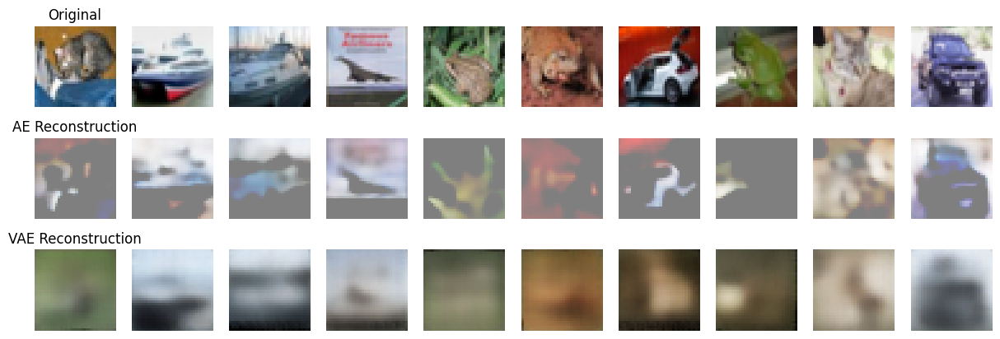

In [ ]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Get a batch of test images
test_images, _ = next(iter(test_loader))
test_images = test_images.to(device)

# Compute reconstructions
with torch.no_grad():
    ae_reconstructed = ae_model(test_images).cpu()
    vae_reconstructed, _, _ = vae(test_images)

ae_loss = F.mse_loss(ae_reconstructed.to(device), test_images).item()
vae_loss = F.mse_loss(vae_reconstructed, test_images).item()

print(f"🔹 Autoencoder Reconstruction Loss: {ae_loss:.4f}")
print(f"🔹 Variational Autoencoder Reconstruction Loss: {vae_loss:.4f}")


fig, axes = plt.subplots(3, 10, figsize=(15, 5))

for i in range(10):

    axes[0, i].imshow(test_images[i].cpu().permute(1, 2, 0) * 0.5 + 0.5)
    axes[0, i].axis("off")


    axes[1, i].imshow(ae_reconstructed[i].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5)
    axes[1, i].axis("off")


    axes[2, i].imshow(vae_reconstructed[i].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5)
    axes[2, i].axis("off")

axes[0, 0].set_title("Original", fontsize=12)
axes[1, 0].set_title("AE Reconstruction", fontsize=12)
axes[2, 0].set_title("VAE Reconstruction", fontsize=12)
plt.show()


VAE Without Regularization

In [ ]:

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = torchvision.datasets.CIFAR10(root="./data", train=True, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)


Files already downloaded and verified


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision
from torch.utils.data import DataLoader
import torch.nn.functional as F
import matplotlib.pyplot as plt


class VAE_NoReg(nn.Module):
    def __init__(self, latent_dim=256):
        super(VAE_NoReg, self).__init__()
        self.latent_dim = latent_dim


        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )


        self.fc_mu = nn.Linear(128 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(128 * 4 * 4, latent_dim)


        self.decoder_input = nn.Linear(latent_dim, 128 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def reparameterization(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        mu, logvar = self.fc_mu(x), self.fc_logvar(x)
        z = self.reparameterization(mu, logvar)
        x = self.decoder_input(z).view(x.size(0), 128, 4, 4)
        x = self.decoder(x)
        return x, mu, logvar

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = torchvision.datasets.CIFAR10(root="./data", train=True, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)


vae_noreg = VAE_NoReg(latent_dim=256).to(device)


optimizer_noreg = optim.Adam(vae_noreg.parameters(), lr=0.001)


scheduler_noreg = optim.lr_scheduler.StepLR(optimizer_noreg, step_size=10, gamma=0.5)


def vae_loss_function(recon_x, x, mu, logvar, beta=0.1):
    reconstruction_loss = F.mse_loss(recon_x, x, reduction="sum")  # MSE loss
    kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return reconstruction_loss + beta * kl_divergence


num_epochs = 50

for epoch in range(num_epochs):
    total_loss = 0
    vae_noreg.train()

    for images, _ in train_loader:
        images = images.to(device)
        optimizer_noreg.zero_grad()
        outputs, mu, logvar = vae_noreg(images)
        loss = vae_loss_function(outputs, images, mu, logvar)
        loss.backward()
        optimizer_noreg.step()
        total_loss += loss.item()

    scheduler_noreg.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss / len(train_loader):.4f}")


torch.save(vae_noreg.state_dict(), "vae_noreg_cifar10.pth")
print("✅ VAE Without Regularization training completed!")


Files already downloaded and verified
Epoch [1/50], Loss: 30859.7758
Epoch [2/50], Loss: 17542.8349
Epoch [3/50], Loss: 14945.0773
Epoch [4/50], Loss: 13510.7191
Epoch [5/50], Loss: 12673.2501
Epoch [6/50], Loss: 12151.3810
Epoch [7/50], Loss: 11798.7022
Epoch [8/50], Loss: 11425.3126
Epoch [9/50], Loss: 11165.4403
Epoch [10/50], Loss: 10994.3628
Epoch [11/50], Loss: 10505.1998
Epoch [12/50], Loss: 10421.8212
Epoch [13/50], Loss: 10354.1008
Epoch [14/50], Loss: 10303.6350
Epoch [15/50], Loss: 10227.6523
Epoch [16/50], Loss: 10185.6837
Epoch [17/50], Loss: 10107.5644
Epoch [18/50], Loss: 10053.0245
Epoch [19/50], Loss: 10038.5585
Epoch [20/50], Loss: 9968.3955
Epoch [21/50], Loss: 9765.1498
Epoch [22/50], Loss: 9748.3939
Epoch [23/50], Loss: 9694.0781
Epoch [24/50], Loss: 9703.6399
Epoch [25/50], Loss: 9690.3582
Epoch [26/50], Loss: 9668.1632
Epoch [27/50], Loss: 9630.6026
Epoch [28/50], Loss: 9610.3310
Epoch [29/50], Loss: 9594.2227
Epoch [30/50], Loss: 9570.0149
Epoch [31/50], Loss: 9

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision
from torch.utils.data import DataLoader
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Define VAE Model with Regularization
class VAE(nn.Module):
    def __init__(self, latent_dim=256):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Dropout(0.3),  # Regularization

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
        )

        # Latent space
        self.fc_mu = nn.Linear(128 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(128 * 4 * 4, latent_dim)

        # Decoder
        self.decoder_input = nn.Linear(latent_dim, 128 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()  # Outputs [-1,1] to match input normalization
        )

    def reparameterization(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std  # Reparameterization trick

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        mu, logvar = self.fc_mu(x), self.fc_logvar(x)
        z = self.reparameterization(mu, logvar)
        x = self.decoder_input(z).view(x.size(0), 128, 4, 4)
        x = self.decoder(x)
        return x, mu, logvar


In [ ]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize VAE
vae = VAE(latent_dim=256).to(device)

# Define optimizer with weight decay (L2 regularization)
optimizer = optim.Adam(vae.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

# Define VAE Loss Function
def vae_loss_function(recon_x, x, mu, logvar, beta=0.1):
    reconstruction_loss = F.mse_loss(recon_x, x, reduction="sum")  # MSE loss
    kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return reconstruction_loss + beta * kl_divergence


In [ ]:
num_epochs = 50

for epoch in range(num_epochs):
    total_loss = 0
    vae.train()

    for images, _ in train_loader:
        images = images.to(device)
        optimizer.zero_grad()
        outputs, mu, logvar = vae(images)
        loss = vae_loss_function(outputs, images, mu, logvar)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    scheduler.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss / len(train_loader):.4f}")

torch.save(vae.state_dict(), "vae_cifar10.pth")
print("✅ VAE with Regularization training completed & saved!")


Epoch [1/50], Loss: 34987.8184
Epoch [2/50], Loss: 21922.2170
Epoch [3/50], Loss: 19391.4290
Epoch [4/50], Loss: 18108.1514
Epoch [5/50], Loss: 17268.1332
Epoch [6/50], Loss: 16792.8355
Epoch [7/50], Loss: 16341.1624
Epoch [8/50], Loss: 15996.2967
Epoch [9/50], Loss: 15760.2458
Epoch [10/50], Loss: 15586.7702
Epoch [11/50], Loss: 15105.7146
Epoch [12/50], Loss: 14985.5824
Epoch [13/50], Loss: 14897.5939
Epoch [14/50], Loss: 14780.6441
Epoch [15/50], Loss: 14743.2226
Epoch [16/50], Loss: 14681.5899
Epoch [17/50], Loss: 14636.9780
Epoch [18/50], Loss: 14582.7180
Epoch [19/50], Loss: 14517.5561
Epoch [20/50], Loss: 14464.8946
Epoch [21/50], Loss: 14266.6992
Epoch [22/50], Loss: 14213.2765
Epoch [23/50], Loss: 14198.5820
Epoch [24/50], Loss: 14149.9524
Epoch [25/50], Loss: 14122.5443
Epoch [26/50], Loss: 14098.9893
Epoch [27/50], Loss: 14098.5962
Epoch [28/50], Loss: 14064.2756
Epoch [29/50], Loss: 14041.4874
Epoch [30/50], Loss: 14008.7588
Epoch [31/50], Loss: 13924.3014
Epoch [32/50], Lo

In [ ]:
import torch

# Load VAE with Regularization
vae_with_reg = VAE(latent_dim=256).to(device)
vae_with_reg.load_state_dict(torch.load("vae_cifar10.pth"))
vae_with_reg.eval()

# Load VAE without Regularization
vae_noreg = VAE_NoReg(latent_dim=256).to(device)
vae_noreg.load_state_dict(torch.load("vae_noreg_cifar10.pth"))
vae_noreg.eval()

print("✅ Both VAE models (with and without regularization) loaded successfully!")


✅ Both VAE models (with and without regularization) loaded successfully!


<ipython-input-50-7872a86126e7>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae_with_reg.load_state_dict(torch.load("vae_cifar10.pth"))
<ipython-input-50-7872a86126e7>:

In [ ]:
import torchvision.transforms as transforms
import torchvision
from torch.utils.data import DataLoader

# Define transform
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load CIFAR-10 test dataset
test_dataset = torchvision.datasets.CIFAR10(root="./data", train=False, transform=transform, download=True)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

print("✅ Test dataset loaded!")


Files already downloaded and verified
✅ Test dataset loaded!


In [ ]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Get a batch of test images
test_images, _ = next(iter(test_loader))
test_images = test_images.to(device)

# Compute reconstructions
with torch.no_grad():
    vae_reg_reconstructed, _, _ = vae_with_reg(test_images)
    vae_noreg_reconstructed, _, _ = vae_noreg(test_images)

# Compute MSE Loss for both models
vae_reg_loss = F.mse_loss(vae_reg_reconstructed, test_images).item()
vae_noreg_loss = F.mse_loss(vae_noreg_reconstructed, test_images).item()

print(f"🔹 VAE with Regularization Loss: {vae_reg_loss:.4f}")
print(f"🔹 VAE without Regularization Loss: {vae_noreg_loss:.4f}")


🔹 VAE with Regularization Loss: 0.0219
🔹 VAE without Regularization Loss: 0.0148


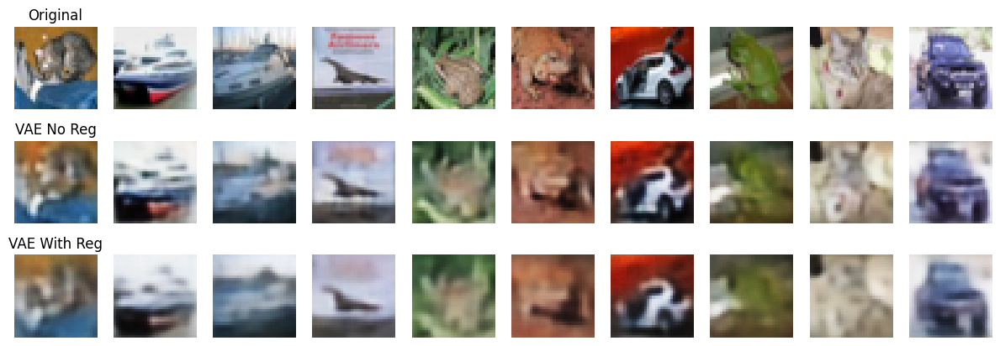

In [ ]:
# Plot Original vs. Reconstructed Images
fig, axes = plt.subplots(3, 10, figsize=(15, 5))

for i in range(10):
    # Original images
    axes[0, i].imshow(test_images[i].cpu().permute(1, 2, 0) * 0.5 + 0.5)
    axes[0, i].axis("off")

    # VAE without Regularization
    axes[1, i].imshow(vae_noreg_reconstructed[i].cpu().permute(1, 2, 0) * 0.5 + 0.5)
    axes[1, i].axis("off")

    # VAE with Regularization
    axes[2, i].imshow(vae_reg_reconstructed[i].cpu().permute(1, 2, 0) * 0.5 + 0.5)
    axes[2, i].axis("off")

axes[0, 0].set_title("Original")
axes[1, 0].set_title("VAE No Reg")
axes[2, 0].set_title("VAE With Reg")
plt.show()


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [4]:
class Autoencoder(nn.Module):
    def __init__(self, latent_dim=100):
        super(Autoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, latent_dim)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 128 * 4 * 4),
            nn.ReLU(),
            nn.Unflatten(1, (128, 4, 4)),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [6]:
class VAE(nn.Module):
    def __init__(self, latent_dim=256):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Dropout(0.3),  # Regularization

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Dropout(0.3),
        )

        self.fc_mu = nn.Linear(128 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(128 * 4 * 4, latent_dim)


        self.decoder_input = nn.Linear(latent_dim, 128 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def reparameterization(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        mu, logvar = self.fc_mu(x), self.fc_logvar(x)
        z = self.reparameterization(mu, logvar)
        x = self.decoder_input(z).view(x.size(0), 128, 4, 4)
        x = self.decoder(x)
        return x, mu, logvar


In [11]:
# Assuming VAE and AutoEncoder classes are already defined elsewhere

# For setting the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define latent dimensions or other model parameters (adjust as needed)
latent_dim = 128

# Load datasets
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Normalize to [-1, 1] range
])

# CIFAR-10 dataset
train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

def vae_loss(recon_x, x, mu, logvar, beta=4, l1_lambda=1e-5, l2_lambda=1e-4, model=None):
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')  # MSE Loss
    kl_div = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())  # KL Divergence

    if model:  # Only apply L1/L2 regularization if model is provided
        l1_loss = sum(p.abs().sum() for p in model.parameters())  # L1 Regularization
        l2_loss = sum((p ** 2).sum() for p in model.parameters())  # L2 Regularization
        return recon_loss + beta * kl_div + l1_lambda * l1_loss + l2_lambda * l2_loss
    else:
        return recon_loss + beta * kl_div  # No L1/L2 if model is None


# Evaluation function
def evaluate_model(model, loader):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for data, _ in loader:
            data = data.to(device)
            recon, mu, logvar = model(data)
            loss = vae_loss(recon, data, mu, logvar)
            total_loss += loss.item()
    return total_loss / len(loader.dataset)


Files already downloaded and verified
Files already downloaded and verified


In [14]:
loss_values = []
kl_values = []
recon_values = []

def train_vae(model, train_loader, optimizer, epoch, device='cuda', beta=4):
    model.train()
    train_loss, recon_loss_total, kl_div_total = 0, 0, 0
    # Define device (use GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        optimizer.zero_grad()

        recon_batch, mu, logvar = model(data)
        loss = vae_loss(recon_batch, data, mu, logvar, beta, model=model)  # Pass model here
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        recon_loss_total += F.mse_loss(recon_batch, data, reduction='sum').item()
        kl_div_total += (-0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())).item()

    # Store losses for visualization
    avg_loss = train_loss / len(train_loader.dataset)
    avg_recon_loss = recon_loss_total / len(train_loader.dataset)
    avg_kl_loss = kl_div_total / len(train_loader.dataset)

    loss_values.append(avg_loss)
    recon_values.append(avg_recon_loss)
    kl_values.append(avg_kl_loss)

    print(f'==> Epoch {epoch}: Average Loss: {avg_loss:.4f}, Recon Loss: {avg_recon_loss:.4f}, KL Divergence: {avg_kl_loss:.4f}')

    # Show generated images after every epoch
    model.eval()
    with torch.no_grad():
        sample = data[:8].to(device)  # Take 8 samples from dataset
        reconstructed, _, _ = model(sample)

        # Rescale from [-1,1] to [0,1] for visualization
        sample = (sample + 1) / 2
        reconstructed = (reconstructed + 1) / 2

        # Plot original vs reconstructed images
        plt.figure(figsize=(10, 2))
        for i in range(8):
            plt.subplot(2, 8, i + 1)
            plt.imshow(sample[i].cpu().numpy().transpose(1, 2, 0))
            plt.axis('off')

            plt.subplot(2, 8, i + 9)
            plt.imshow(reconstructed[i].cpu().numpy().transpose(1, 2, 0))
            plt.axis('off')

        plt.show()


<ipython-input-15-32728d085669>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae.load_state_dict(torch.load("vae_cifar10 (1).pth"))


==> Epoch 1: Average Loss: 347.3529, Recon Loss: 251.1609, KL Divergence: 24.0416


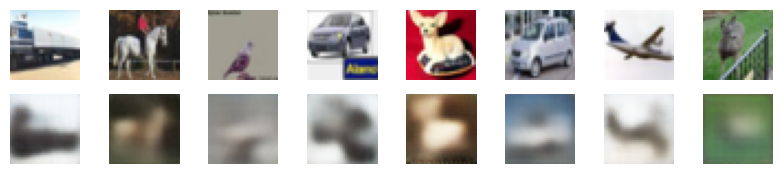

==> Epoch 2: Average Loss: 327.4349, Recon Loss: 238.7188, KL Divergence: 22.1724


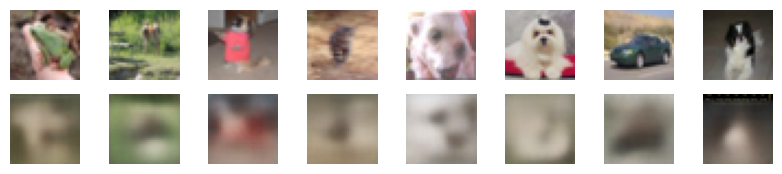

==> Epoch 3: Average Loss: 321.1590, Recon Loss: 235.0918, KL Divergence: 21.5098


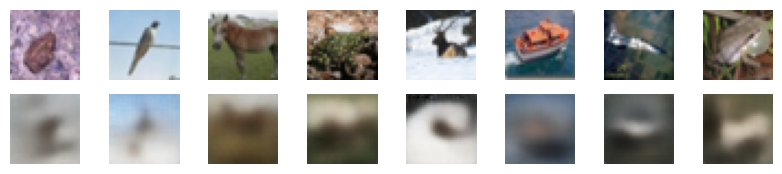

==> Epoch 4: Average Loss: 317.2613, Recon Loss: 232.1438, KL Divergence: 21.2722


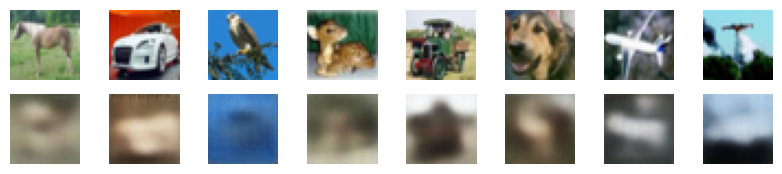

==> Epoch 5: Average Loss: 316.8288, Recon Loss: 231.9291, KL Divergence: 21.2175


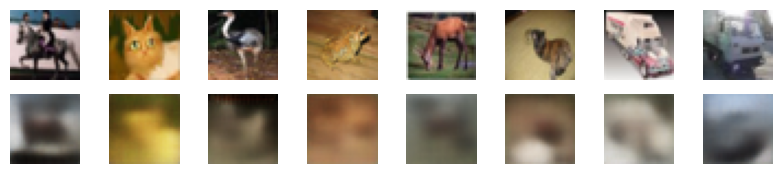

==> Epoch 6: Average Loss: 316.0874, Recon Loss: 231.1835, KL Divergence: 21.2182


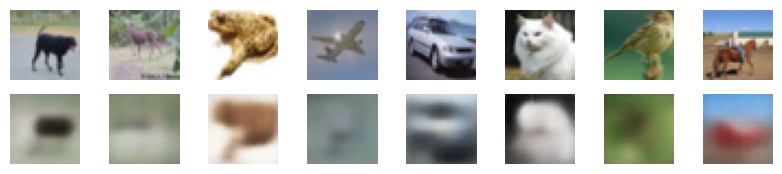

==> Epoch 7: Average Loss: 315.0366, Recon Loss: 230.1121, KL Divergence: 21.2231


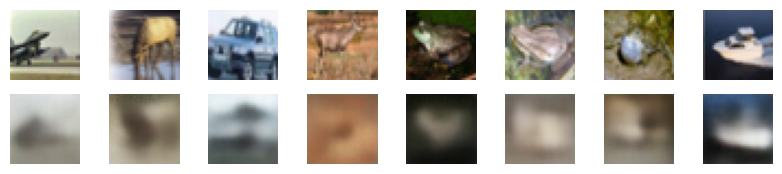

==> Epoch 8: Average Loss: 314.2899, Recon Loss: 229.2664, KL Divergence: 21.2475


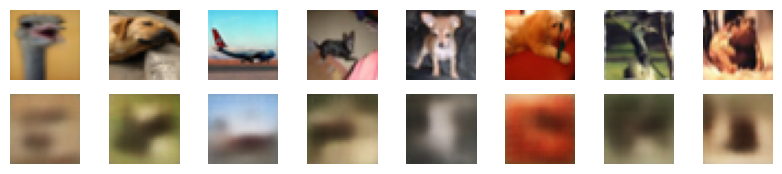

==> Epoch 9: Average Loss: 313.9427, Recon Loss: 228.8597, KL Divergence: 21.2620


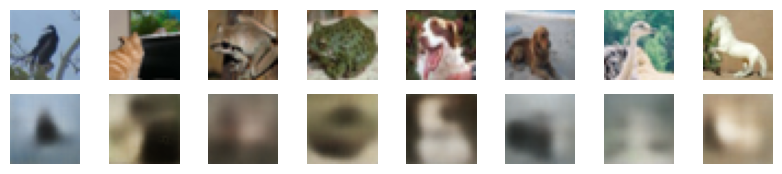

==> Epoch 10: Average Loss: 313.1712, Recon Loss: 228.1115, KL Divergence: 21.2559


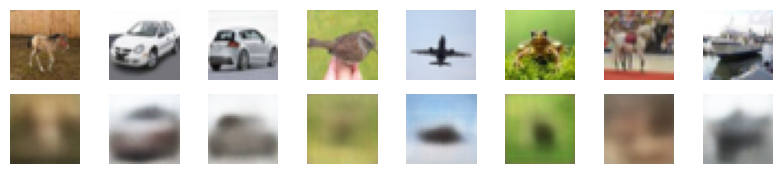

In [15]:
# Load the saved VAE model
# Change latent_dim to 256 to match the saved model
vae = VAE(latent_dim=256).to(device)
vae.load_state_dict(torch.load("vae_cifar10 (1).pth"))
vae.eval()

# Adjust optimizer parameters (e.g., learning rate)
optimizer = optim.Adam(vae.parameters(), lr=0.001)  # Try different learning rates

# Run partial training or evaluation
EPOCHS = 10
for epoch in range(1, EPOCHS + 1):
    train_vae(vae, train_loader, optimizer, epoch)
    evaluate_model(vae, test_loader)


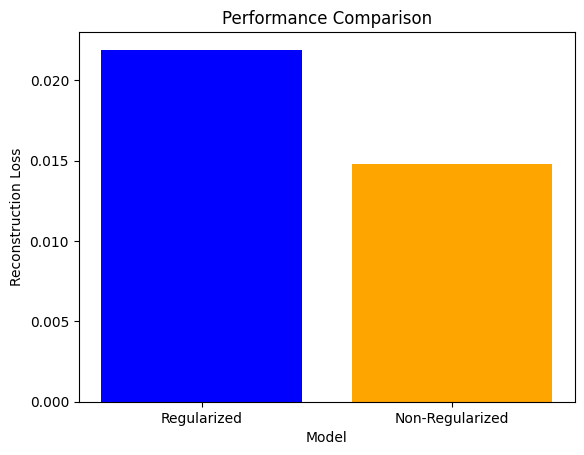

In [19]:
import matplotlib.pyplot as plt

# Plot reconstruction loss comparison
models = ['Regularized', 'Non-Regularized']
losses = [0.0219, 0.0148]  # Convert to float

plt.bar(models, losses, color=['blue', 'orange'], bottom=0) # set bottom=0
plt.xlabel('Model')
plt.ylabel('Reconstruction Loss')
plt.title('Performance Comparison')
plt.show()

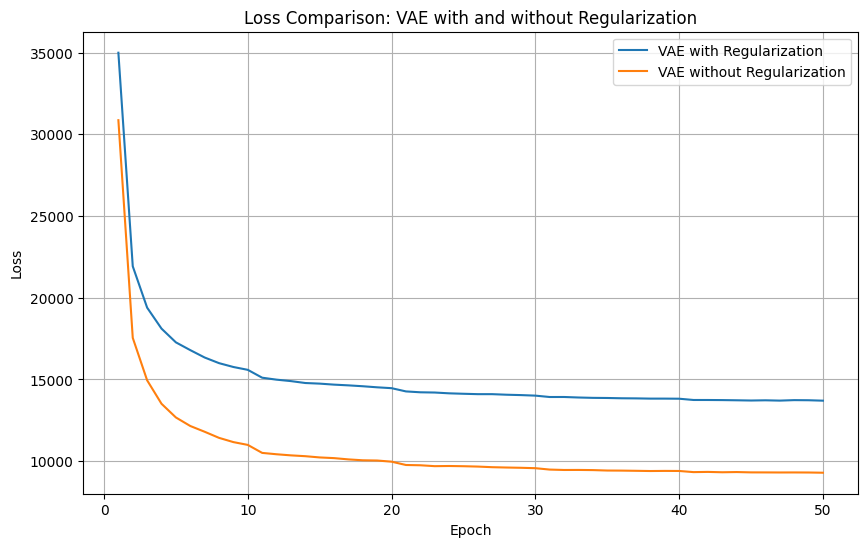

In [20]:
import matplotlib.pyplot as plt

# Loss values for VAE with Regularization
vae_with_reg = [
    34987.8184, 21922.2170, 19391.4290, 18108.1514, 17268.1332,
    16792.8355, 16341.1624, 15996.2967, 15760.2458, 15586.7702,
    15105.7146, 14985.5824, 14897.5939, 14780.6441, 14743.2226,
    14681.5899, 14636.9780, 14582.7180, 14517.5561, 14464.8946,
    14266.6992, 14213.2765, 14198.5820, 14149.9524, 14122.5443,
    14098.9893, 14098.5962, 14064.2756, 14041.4874, 14008.7588,
    13924.3014, 13925.4189, 13894.2797, 13872.5633, 13864.8218,
    13847.2065, 13840.5705, 13826.2087, 13826.2359, 13820.1082,
    13742.5558, 13741.6857, 13735.9788, 13724.1310, 13709.8442,
    13722.9899, 13703.9779, 13733.5651, 13726.6685, 13700.3506,
]

# Loss values for VAE without Regularization
vae_without_reg = [
    30859.7758, 17542.8349, 14945.0773, 13510.7191, 12673.2501,
    12151.3810, 11798.7022, 11425.3126, 11165.4403, 10994.3628,
    10505.1998, 10421.8212, 10354.1008, 10303.6350, 10227.6523,
    10185.6837, 10107.5644, 10053.0245, 10038.5585, 9968.3955,
    9765.1498, 9748.3939, 9694.0781, 9703.6399, 9690.3582,
    9668.1632, 9630.6026, 9610.3310, 9594.2227, 9570.0149,
    9484.6716, 9460.1675, 9462.7001, 9453.2469, 9426.2828,
    9421.6335, 9409.5197, 9396.1926, 9403.4257, 9399.6727,
    9329.6525, 9342.2452, 9320.5233, 9333.3337, 9313.2004,
    9311.1994, 9307.3545, 9309.5377, 9305.8277, 9292.4408,
]

# Plotting the Loss Graph
epochs = range(1, 51)

plt.figure(figsize=(10, 6))
plt.plot(epochs, vae_with_reg, label="VAE with Regularization")
plt.plot(epochs, vae_without_reg, label="VAE without Regularization")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Comparison: VAE with and without Regularization")
plt.legend()
plt.grid(True)
plt.show()
